## Carvana Cars Data Cleaning, Wrangling & Pre-Processing

In [108]:
import numpy as np
import pandas as pd
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go
import plotly.graph_objs as pg
import time 
import re

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_regression
import scipy.stats as stats
from scipy.stats import zscore
import pylab
import pycaret
from pycaret.anomaly import *

pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)

import warnings
warnings.filterwarnings('ignore')

In [2]:
carvana_df = pd.read_csv("carvana_cars.csv")
carvana_df.drop(columns=['Unnamed: 0'], inplace=True)

In [3]:
carvana_df.head()

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
0,Ram,1500 Crew Cab,Big Horn Pickup 4D 5 1/2 ft,2017.0,47569.0,31990.0,Winder,GA,17.0,25.0,6.0,"V6, VVT, 3.6 Liter",Flexible Fuel,2WD,Gray,Gray,"Automatic, 8-Spd",2.0,4.0,6.0,0.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0
1,Cadillac,ATS,2.5L Luxury Sedan 4D,2015.0,42722.0,22590.0,Heath,OH,21.0,33.0,4.0,"4-Cyl, 2.5 Liter",Gas,RWD,Silver,Gray,"Automatic, 6-Spd",2.0,4.0,5.0,3319.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,5.0
2,Buick,Regal,Sedan 4D,2016.0,48730.0,19990.0,Greenfield,IN,19.0,27.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,AWD,White,Black,"Automatic, 6-Spd",2.0,4.0,5.0,3692.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0
3,Toyota,Venza,Wagon 4D,2011.0,95381.0,15990.0,Bessemer,AL,21.0,27.0,4.0,"4-Cyl, 2.7 Liter",Gas,FWD,White,Gray,Automatic,2.0,4.0,5.0,3945.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0
4,Hyundai,Elantra GT,Hatchback 4D,2017.0,65084.0,16590.0,San Antonio,TX,24.0,32.0,4.0,"4-Cyl, 2.0 Liter",Gas,FWD,Red,Black,"Auto, 6-Spd Shiftronic",1.0,4.0,5.0,2908.0,"[{'facetId': 10, 'facetName': 'Hands Free Call...",True,True,True,True,True,False,4.0


## Missing Value Imputation

In [4]:
carvana_df.index[carvana_df.isnull().all(1)]

Int64Index([3114, 3115, 6393, 7193], dtype='int64')

Let's drop the rows where all values are NaN.

In [5]:
carvana_df.dropna(how='all', inplace=True)

Now, let's handle and impute the missing values in the data of each column.

In [6]:
carvana_df.isnull().sum()

make                     0
model                    0
trim                     0
year                     0
mileage                  0
price                    0
city                     0
state                    0
mpgCity                392
mpgHighway             391
engineCylinderCount     24
engineDesc               0
fuel                     2
driveTrain               0
exteriorColor            0
interiorColor           94
transmission             0
numberOfKeys             0
doors                    1
seating                  4
curbWeight               0
facets                   0
AC                       0
PowerWindows             0
CDPlayer                 0
PowerLocks               0
TiltWheel                0
PowerSeats               0
imperfections           19
dtype: int64

We primarily have missing values for the MPG columns, let's work on those columns first.

In [7]:
carvana_df.describe()

,year,mileage,price,mpgCity,mpgHighway,engineCylinderCount,numberOfKeys,doors,seating,curbWeight,imperfections
count,12660.000000,12660.000000,12660.000000,12268.000000,12269.000000,12636.000000,12660.000000,12659.000000,12656.000000,12660.000000,12641.000000
mean,2016.603160,51994.817694,24597.964455,23.031790,30.983699,4.627493,1.691706,3.907576,5.161820,3171.130095,3.252274
std,2.571027,25878.853529,9276.790962,4.597695,5.422278,1.116116,0.484186,0.417831,0.779356,1278.062847,1.035925
min,2009.000000,1.000000,10990.000000,11.000000,16.000000,0.000000,1.000000,2.000000,2.000000,0.000000,0.000000
25%,2015.000000,31965.500000,18590.000000,20.000000,27.000000,4.000000,1.000000,4.000000,5.000000,2855.000000,3.000000
50%,2017.000000,50822.500000,21590.000000,23.000000,31.000000,4.000000,2.000000,4.000000,5.000000,3327.000000,3.000000
75%,2019.000000,71846.750000,26990.000000,26.000000,36.000000,6.000000,2.000000,4.000000,5.000000,3909.000000,4.000000
max,2022.000000,113125.000000,105990.000000,54.000000,50.000000,8.000000,4.000000,5.000000,8.000000,7470.000000,15.000000


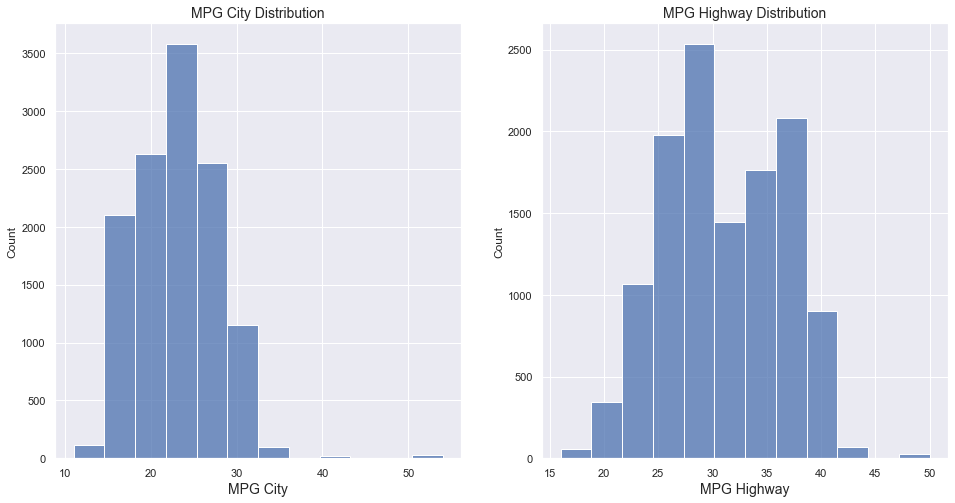

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))

g1 = sns.histplot(data=carvana_df, x='mpgCity', bins=12, ax=ax1)
g1.set_title("MPG City Distribution", fontsize=14)
g1.set_xlabel("MPG City", fontsize=14)

g2 = sns.histplot(data=carvana_df, x='mpgHighway', bins=12, ax=ax2)
g2.set_title("MPG Highway Distribution", fontsize=14)
g2.set_xlabel("MPG Highway", fontsize=14)

plt.show()

Let's take a look at the rows more closely.

In [9]:
carvana_df[pd.isnull(carvana_df['mpgCity'])]

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
6,Ford,F150 SuperCrew Cab,XLT Pickup 4D 5 1/2 ft,2018.0,67865.0,31990.0,Heath,OH,NaN,NaN,6.0,"V6, Flex Fuel, 3.3 Liter",Flexible Fuel,2WD,Silver,Gray,"Auto, 6-Spd SelShft",2.0,4.0,6.0,0.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
69,Ford,Taurus,SEL Sedan 4D,2013.0,55912.0,16990.0,West Memphis,AR,NaN,NaN,6.0,"V6, 3.5 Liter",Gas,FWD,Silver,Black,"Automatic, 6-Spd",2.0,4.0,5.0,4037.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0
125,Chevrolet,Malibu,LT Sedan 4D,2016.0,40607.0,19590.0,Trenton,OH,NaN,NaN,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,FWD,Red,Gray,"Automatic, 6-Spd",1.0,4.0,5.0,3126.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,7.0
127,Jeep,Renegade,Altitude Sport Utility 4D,2017.0,47076.0,21590.0,Haines City,FL,NaN,NaN,4.0,"4-Cyl, MultiAir, 1.4T",Gas,2WD,Black,Black,"Automatic, 9-Spd",2.0,4.0,5.0,3210.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,False,3.0
141,Ford,Focus,SE Sedan 4D,2018.0,30749.0,16990.0,Greenfield,IN,NaN,NaN,3.0,"3-Cyl, EcoBoost, 1.0T",Gas,FWD,Gold,Gray,"Auto, 6-Spd Powershift",2.0,4.0,5.0,2960.0,[],True,True,True,True,True,False,3.0
165,Jeep,Renegade,Limited Sport Utility 4D,2017.0,51742.0,21590.0,Haines City,FL,NaN,NaN,4.0,"4-Cyl, MultiAir, 2.4L",Gas,2WD,Gray,Black,"Automatic, 9-Spd",2.0,4.0,5.0,3327.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,2.0
185,Jeep,Renegade,Latitude Sport Utility 4D,2015.0,72452.0,18590.0,West Memphis,AR,NaN,NaN,4.0,4Cyl MltiAir Tgrshrk 2.4L,Gas,2WD,White,Black,"Automatic, 9-Spd",2.0,4.0,5.0,3190.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
218,GMC,Sierra 1500 Crew Cab,SLT Pickup 4D 5 3/4 ft,2017.0,50936.0,41590.0,West Memphis,AR,NaN,NaN,8.0,"V8, EcoTec3, 6.2 Liter",Gas,2WD,White,Gray,"Auto, 6-Spd HD Overdrive",2.0,4.0,6.0,5300.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0
242,Ford,F150 SuperCrew Cab,XLT Pickup 4D 5 1/2 ft,2018.0,56048.0,34590.0,Blue Mound,TX,NaN,NaN,8.0,"V8, Flex Fuel, 5.0 Liter",Flexible Fuel,2WD,White,Gray,"Auto, 6-Spd SelShft",2.0,4.0,6.0,0.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
249,Chevrolet,Silverado 1500 Crew Cab,LT Pickup 4D 5 3/4 ft,2019.0,25315.0,38990.0,Heath,OH,NaN,NaN,4.0,"4-Cyl, Turbo, 2.7 Liter",Gas,4WD,White,Black,"Automatic, 8-Spd w/Overdrive",1.0,4.0,6.0,4915.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0


We can see that records with mising mpgCity values are also nearly the same as mpgHighway. Also, there is a wide variation in the kinds of vehicles these missing values come from.

Since the distributions of both attributes are fairly normal, and the missing value counts for both are only around 3%, I will elect to impute these two columns with their respective means.

In [10]:
imp_cols = ['mpgCity', 'mpgHighway']

for col in imp_cols:
    imp = SimpleImputer(missing_values=np.nan, strategy='mean')
    imp_temp = imp.fit_transform(carvana_df[[col]]).ravel()
    carvana_df[col] = imp_temp

We'll now look at the next most frequent missing value column, being interior color. I'll start by looking at the rows where the interior color is NaN.

In [11]:
carvana_df[pd.isnull(carvana_df['interiorColor'])]

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
143,Jeep,Cherokee,Limited Sport Utility 4D,2018.0,24158.0,28990.0,Trenton,OH,19.00000,25.000000,4.0,"4-Cyl, 2.4 Liter",Gas,4WD,Black,NaN,"Automatic, 9-Spd",1.0,4.0,5.0,3953.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,4.0
528,Subaru,Forester,2.5X Premium Sport Utility 4D,2011.0,78428.0,17990.0,Oklahoma City,OK,21.00000,27.000000,4.0,"4-Cyl, PZEV, 2.5 Liter",Gas,AWD,White,NaN,"Manual, 5-Spd w/Overdrive",1.0,4.0,5.0,3300.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0
529,Subaru,Ascent,Limited Sport Utility 4D,2020.0,20556.0,40990.0,Blue Mound,TX,20.00000,26.000000,4.0,"4-Cyl, Turbo, 2.4 Liter",Gas,AWD,Red,NaN,"Automatic, CVT w/Lineartronic",2.0,4.0,8.0,4499.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0
561,Nissan,Frontier Crew Cab,PRO-4X Pickup 4D 5 ft,2019.0,21786.0,34590.0,Blue Mound,TX,15.00000,21.000000,6.0,"V6, FFV, 4.0 Liter",Flexible Fuel,4WD,Red,NaN,"Automatic, 5-Spd",2.0,4.0,5.0,4573.0,"[{'facetId': 4, 'facetName': 'Navigation'}, {'...",False,False,False,False,False,False,3.0
595,Toyota,Tacoma Double Cab,TRD Off-Road Pickup 4D 5 ft,2021.0,4961.0,42590.0,Winder,GA,19.00000,24.000000,6.0,"V6, 3.5 Liter",Gas,2WD,Silver,NaN,"Automatic, 6-Spd",2.0,4.0,5.0,4445.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0
611,BMW,3 Series,330i Sedan 4D,2018.0,31374.0,31990.0,Concord,NC,24.00000,34.000000,4.0,"4-Cyl, SULEV, Turbo, 2.0L",Gas,RWD,Silver,NaN,"Auto, 8-Spd Sport",1.0,4.0,5.0,3541.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0
630,INFINITI,QX80,LUXE Sport Utility 4D,2019.0,41079.0,48590.0,San Antonio,TX,14.00000,20.000000,8.0,"V8, 5.6 Liter",Gas,RWD,Black,NaN,"Automatic, 7-Spd Adaptive w/Manual Mode & Down...",2.0,4.0,7.0,5926.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0
675,Toyota,Camry,LE Sedan 4D,2012.0,84948.0,15590.0,Oklahoma City,OK,25.00000,35.000000,4.0,"4-Cyl, 2.5 Liter",Gas,FWD,Beige,NaN,"Automatic, 6-Spd",2.0,4.0,5.0,3190.0,"[{'facetId': 15, 'facetName': 'Power Driver Se...",True,True,True,True,True,True,3.0
759,Jeep,Wrangler Unlimited,Sport SUV 4D,2020.0,28008.0,44990.0,Heath,OH,18.00000,22.000000,6.0,"V6, VVT, 3.6 Liter",Gas,4WD,Gray,NaN,"Automatic, 8-Spd",2.0,4.0,5.0,4196.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,False,False,False,True,False,3.0
778,Subaru,Outback,Limited Wagon 4D,2020.0,19032.0,36990.0,Winder,GA,26.00000,33.000000,4.0,"4-Cyl, 2.5 Liter",Gas,AWD,Green,NaN,"Automatic, CVT w/Lineartronic",2.0,4.0,5.0,3686.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0


There doesn't appear to be any patterns in the records with missing interior color values. Since only 94 records have missing values, I will elect to impute this column with the mode.

In [12]:
#Imputing the interiorColor attribute's missing values
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_temp = imp.fit_transform(carvana_df[['interiorColor']]).ravel()
carvana_df['interiorColor'] = imp_temp


The next column with missing values we have belong to the imperfections column with just 19. Since there are so few missing values, and the mode of this column is much higher than even the second most frequent column, I will elect to impute this column with the mode as well.

In [13]:
carvana_df[pd.isnull(carvana_df['imperfections'])]

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
6424,Kia,Sorento,EX Sport Utility 4D,2016.0,47847.0,23990.0,Toleson,AZ,18.0,26.0,6.0,"V6, GDI, 3.3 Liter",Gas,FWD,Black,Black,"Auto, 6-Spd OD Sptmatc",1.0,4.0,7.0,4343.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN
7492,FIAT,500,Pop Hatchback 2D,2013.0,70928.0,11990.0,Tolleson,AZ,27.0,34.0,4.0,"4-Cyl, MltiAir Trbo, 1.4L",Gas,FWD,Green,Other,"Automatic, 6-Spd",1.0,2.0,4.0,2363.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,False,NaN
7536,GMC,Acadia,Denali Sport Utility 4D,2013.0,88194.0,23590.0,Lebanon,TN,16.0,23.0,6.0,"V6, 3.6 Liter",Gas,AWD,White,Brown,"Automatic, 6-Spd",1.0,4.0,7.0,4850.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN
7844,Nissan,370Z,Touring Coupe 2D,2009.0,96647.0,20590.0,Concord,NC,18.0,26.0,6.0,"V6, 3.7 Liter",Gas,RWD,Black,Black,"Manual, 6-Spd w/Overdrive",1.0,2.0,2.0,3314.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN
9613,Kia,Rondo,LX Wagon 4D,2009.0,57699.0,10990.0,Concord,NC,20.0,27.0,4.0,"4-Cyl, 2.4 Liter",Gas,FWD,Beige,Beige,"Automatic, 4-Spd w/Overdrive & Manual Mode",1.0,4.0,5.0,3333.0,[],True,True,True,True,True,False,NaN
10202,Volkswagen,Jetta,2.0T GLI Autobahn Sedan 4D,2013.0,79947.0,17990.0,Haines City,FL,24.0,32.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,FWD,Gray,Black,Auto 6-Spd DSG Tptrnc Spt,1.0,4.0,5.0,3158.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",False,False,True,False,False,False,NaN
10673,Chevrolet,Colorado Extended Cab,Work Truck Pickup 2D 6 ft,2015.0,104934.0,19590.0,West Memphis,AR,20.0,27.0,4.0,"4-Cyl, VVT, 2.5 Liter",Gas,RWD,White,Gray,"Automatic, 6-Spd",1.0,2.0,5.0,3959.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,False,True,True,NaN
10725,Genesis,G90,3.3T Premium Sedan 4D,2019.0,12711.0,48990.0,Winder,GA,17.0,24.0,6.0,"V6, Twin Turbo, 3.3 Liter",Gas,RWD,Black,Black,"Automatic, 8-Spd w/Shiftronic",1.0,4.0,5.0,4630.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN
10747,BMW,5 Series,535i xDrive Sedan 4D,2012.0,74444.0,19990.0,Concord,NC,21.0,30.0,6.0,"6-Cyl, Turbo, 3.0 Liter",Gas,AWD,Gray,Black,Auto 8-Spd Stptrnc Spt MM,1.0,4.0,5.0,3233.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN
10857,BMW,5 Series,550i xDrive Sedan 4D,2011.0,60630.0,21990.0,Delanco,NJ,16.0,24.0,8.0,"V8, Twin Turbo, 4.4 Liter",Gas,AWD,Black,Black,"Auto, 8-Spd OD Steptronic",1.0,4.0,5.0,4519.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,NaN


In [14]:
carvana_df['imperfections'].value_counts()

3.0     6739
4.0     3086
2.0     1548
5.0      550
1.0      339
6.0      197
7.0       75
0.0       35
8.0       34
9.0       15
10.0      13
11.0       4
12.0       3
13.0       1
15.0       1
14.0       1
Name: imperfections, dtype: int64

In [15]:
#Imputing the imperfections attribute's missing values
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_temp = imp.fit_transform(carvana_df[['imperfections']]).ravel()
carvana_df['imperfections'] = imp_temp


For the column <i>engineCylinderCount</i>, all the vehicles here are electric, implying that these vehicles were not assigned a value for cylinders since it isn't how these vehicles are constructed. Let's look at the other electric vehicles in the dataset and see how those values were assigned.

In [16]:
carvana_df[pd.isnull(carvana_df['engineCylinderCount'])]

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
648,Tesla,Model S,Sedan 4D,2014.0,53841.0,42990.0,Tolleson,AZ,23.03179,30.983699,NaN,AC Electric Motor,Electric,RWD,Gray,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,4647.0,"[{'facetId': 4, 'facetName': 'Navigation'}, {'...",True,True,False,False,True,True,4.0
2469,Chevrolet,Spark EV,2LT Hatchback 4D,2016.0,47288.0,15990.0,Trenton,OH,23.03179,30.983699,NaN,Electric Motor,Electric,FWD,Red,Gray,Single-Speed Fixed Gear,2.0,4.0,4.0,0.0,"[{'facetId': 6, 'facetName': 'Heated Seats'}, ...",True,True,False,True,True,False,3.0
3020,Nissan,LEAF,S Hatchback 4D,2015.0,59832.0,15590.0,Concord,NC,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Black,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
4031,Nissan,LEAF,S Hatchback 4D,2015.0,55853.0,15990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,White,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
5330,Polestar,2,Long Range Dual Motor Hatchback 4D,2022.0,123.0,62990.0,Blue Mound,TX,23.03179,30.983699,NaN,Dual Electric Motors,Electric,AWD,Gray,Gray,Single-Speed Fixed Gear,1.0,4.0,5.0,4658.0,"[{'facetId': 4, 'facetName': 'Navigation'}, {'...",True,False,False,True,False,True,3.0
5531,Nissan,LEAF,S Hatchback 4D,2015.0,59210.0,15990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,4.0
5969,Nissan,LEAF,S Hatchback 4D,2015.0,42871.0,16990.0,Winder,GA,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,[],True,True,True,True,True,False,3.0
6160,Nissan,LEAF,S Hatchback 4D,2015.0,31958.0,16990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,8.0
6485,Chevrolet,Spark EV,2LT Hatchback 4D,2014.0,48589.0,15590.0,Greenfield,IN,23.03179,30.983699,NaN,Electric Motor,Electric,FWD,Blue,Black,Single-Speed Fixed Gear,2.0,4.0,4.0,2989.0,"[{'facetId': 6, 'facetName': 'Heated Seats'}, ...",True,True,False,True,True,False,3.0
6730,Nissan,LEAF,S Hatchback 4D,2015.0,62086.0,15990.0,Bessemer,AL,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Black,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,6.0


In [17]:
carvana_df[carvana_df['fuel']=='Electric']

,make,model,trim,year,mileage,price,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections
648,Tesla,Model S,Sedan 4D,2014.0,53841.0,42990.0,Tolleson,AZ,23.03179,30.983699,NaN,AC Electric Motor,Electric,RWD,Gray,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,4647.0,"[{'facetId': 4, 'facetName': 'Navigation'}, {'...",True,True,False,False,True,True,4.0
2469,Chevrolet,Spark EV,2LT Hatchback 4D,2016.0,47288.0,15990.0,Trenton,OH,23.03179,30.983699,NaN,Electric Motor,Electric,FWD,Red,Gray,Single-Speed Fixed Gear,2.0,4.0,4.0,0.0,"[{'facetId': 6, 'facetName': 'Heated Seats'}, ...",True,True,False,True,True,False,3.0
3020,Nissan,LEAF,S Hatchback 4D,2015.0,59832.0,15590.0,Concord,NC,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Black,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
4031,Nissan,LEAF,S Hatchback 4D,2015.0,55853.0,15990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,White,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,3.0
5330,Polestar,2,Long Range Dual Motor Hatchback 4D,2022.0,123.0,62990.0,Blue Mound,TX,23.03179,30.983699,NaN,Dual Electric Motors,Electric,AWD,Gray,Gray,Single-Speed Fixed Gear,1.0,4.0,5.0,4658.0,"[{'facetId': 4, 'facetName': 'Navigation'}, {'...",True,False,False,True,False,True,3.0
5531,Nissan,LEAF,S Hatchback 4D,2015.0,59210.0,15990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,4.0
5969,Nissan,LEAF,S Hatchback 4D,2015.0,42871.0,16990.0,Winder,GA,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,[],True,True,True,True,True,False,3.0
6160,Nissan,LEAF,S Hatchback 4D,2015.0,31958.0,16990.0,Greenfield,IN,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Silver,Black,Single-Speed Fixed Gear,2.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,8.0
6485,Chevrolet,Spark EV,2LT Hatchback 4D,2014.0,48589.0,15590.0,Greenfield,IN,23.03179,30.983699,NaN,Electric Motor,Electric,FWD,Blue,Black,Single-Speed Fixed Gear,2.0,4.0,4.0,2989.0,"[{'facetId': 6, 'facetName': 'Heated Seats'}, ...",True,True,False,True,True,False,3.0
6730,Nissan,LEAF,S Hatchback 4D,2015.0,62086.0,15990.0,Bessemer,AL,23.03179,30.983699,NaN,AC Electric Motor,Electric,FWD,Black,Black,Single-Speed Fixed Gear,1.0,4.0,5.0,3243.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,True,True,True,False,6.0


In [18]:
carvana_df['engineCylinderCount'].value_counts()

4.0    8888
6.0    2985
8.0     529
3.0     170
5.0      49
2.0      10
1.0       4
0.0       1
Name: engineCylinderCount, dtype: int64

It looks like we have a record where 0.0 was assigned but also for the engine description. Since these are electric vehicles, I believe it would make sense to impute this column with 0.0.

In [19]:
#Imputing the engineCylinderCount attribute's missing values
carvana_df['engineCylinderCount'].fillna(0.0, inplace=True)


Laslty we have fuel, seating, and doors with just handfulls of missing values to impute. I'll impute these columns with mode as well since there are so few records missing. After looking at the few rows where these values were missing, they appear to be missing at random.

In [20]:
imp_cols = ['fuel', 'doors', 'seating']

for col in imp_cols:
    imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    imp_temp = imp.fit_transform(carvana_df[[col]]).ravel()
    carvana_df[col] = imp_temp

In [21]:
carvana_df.isnull().sum()

make                   0
model                  0
trim                   0
year                   0
mileage                0
price                  0
city                   0
state                  0
mpgCity                0
mpgHighway             0
engineCylinderCount    0
engineDesc             0
fuel                   0
driveTrain             0
exteriorColor          0
interiorColor          0
transmission           0
numberOfKeys           0
doors                  0
seating                0
curbWeight             0
facets                 0
AC                     0
PowerWindows           0
CDPlayer               0
PowerLocks             0
TiltWheel              0
PowerSeats             0
imperfections          0
dtype: int64

In [22]:
#There seem to be a lot of missing/0.0 values for the Curb Wright of vehicles. Since the weight of a vehicle does not 
#implicitly affect the price of a car, I believe we will just drop this column.

carvana_df['curbWeight'].value_counts()

0.0       1346
3325.0     149
4510.0     132
3953.0     129
3300.0     111
3237.0     107
2811.0     105
3190.0     104
2855.0      99
4216.0      91
2784.0      82
2578.0      82
3327.0      81
4330.0      79
3427.0      79
2865.0      74
2818.0      72
2960.0      71
3193.0      70
2942.0      69
3526.0      68
3758.0      68
4343.0      68
2278.0      62
3818.0      62
3431.0      61
2844.0      60
3473.0      60
2800.0      57
3230.0      54
3832.0      54
2701.0      54
3305.0      54
3124.0      53
3240.0      52
2714.0      48
3226.0      47
3788.0      46
3470.0      46
2537.0      45
3449.0      43
2837.0      43
3433.0      43
3448.0      43
4445.0      43
3219.0      42
3415.0      42
2804.0      41
3552.0      41
3459.0      41
3250.0      40
3212.0      40
3254.0      38
4387.0      38
2416.0      38
3614.0      38
3487.0      37
3274.0      37
2805.0      37
3210.0      37
2903.0      37
4629.0      37
3080.0      36
2895.0      36
3369.0      35
2815.0      35
3940.0    

We have now concluded imputing all of the NaN/missing values in our dataframe. 

## Attribute Encoding & Feature Transformation/Engineering
Before we try to detect any outliers, we need to reformat the attributes of high cardinality and encode these attributes appropriately. To help make judgements on what columns to retain, we'll also take a look at the correlation matrix of the data.

In [23]:
prices = carvana_df['price']
carvana_df['Price'] = prices
carvana_df.drop(columns=['price'], inplace=True)

In [24]:
carvana_df.head()

,make,model,trim,year,mileage,city,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,curbWeight,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,Price
0,Ram,1500 Crew Cab,Big Horn Pickup 4D 5 1/2 ft,2017.0,47569.0,Winder,GA,17.0,25.0,6.0,"V6, VVT, 3.6 Liter",Flexible Fuel,2WD,Gray,Gray,"Automatic, 8-Spd",2.0,4.0,6.0,0.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0,31990.0
1,Cadillac,ATS,2.5L Luxury Sedan 4D,2015.0,42722.0,Heath,OH,21.0,33.0,4.0,"4-Cyl, 2.5 Liter",Gas,RWD,Silver,Gray,"Automatic, 6-Spd",2.0,4.0,5.0,3319.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,5.0,22590.0
2,Buick,Regal,Sedan 4D,2016.0,48730.0,Greenfield,IN,19.0,27.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,AWD,White,Black,"Automatic, 6-Spd",2.0,4.0,5.0,3692.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0,19990.0
3,Toyota,Venza,Wagon 4D,2011.0,95381.0,Bessemer,AL,21.0,27.0,4.0,"4-Cyl, 2.7 Liter",Gas,FWD,White,Gray,Automatic,2.0,4.0,5.0,3945.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0,15990.0
4,Hyundai,Elantra GT,Hatchback 4D,2017.0,65084.0,San Antonio,TX,24.0,32.0,4.0,"4-Cyl, 2.0 Liter",Gas,FWD,Red,Black,"Auto, 6-Spd Shiftronic",1.0,4.0,5.0,2908.0,"[{'facetId': 10, 'facetName': 'Hands Free Call...",True,True,True,True,True,False,4.0,16590.0


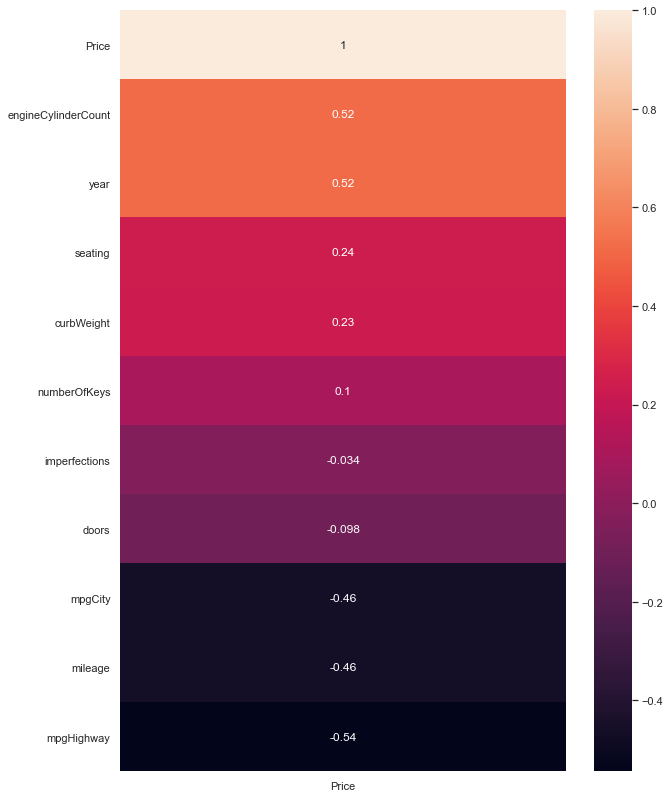

In [25]:
plt.figure(figsize=(10, 14)) 
heatmap = sns.heatmap(carvana_df.corr()[['Price']].sort_values(by='Price', ascending=False), annot=True)

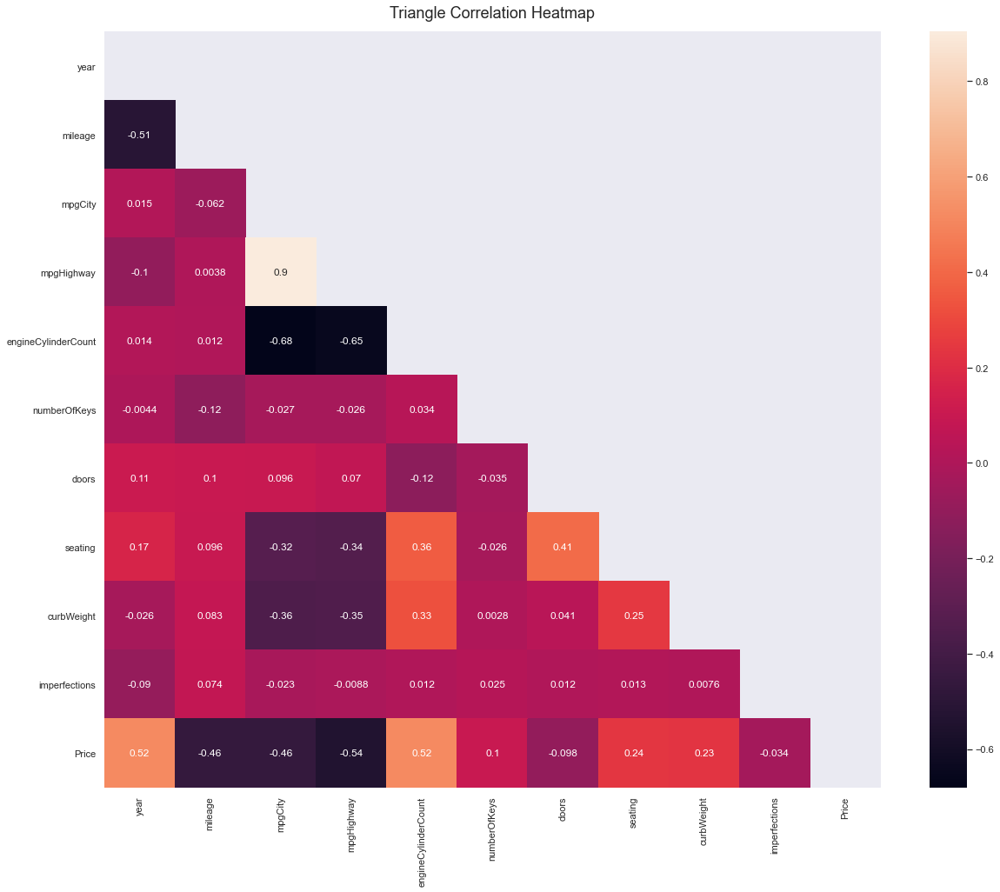

In [26]:
plt.figure(figsize=(20, 16))
mask = np.triu(np.ones_like(carvana_df.loc[:, :'Price'].corr(), dtype=np.bool))
heatmap = sns.heatmap(carvana_df.loc[:, :'Price'].corr(), annot=True, mask=mask)
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

Before making any transformations, it seems that the only columns where <b>multicollinearity</b> would be a concern is the MPG City and Highway columns. We'll keep note of this as we make transformations.

First, I want to proceed with removing columns that have extremely high <b>cardinality.</b> The <i>model</i> column is an example of this. We also know that make and model are linked together since only certain models come from certain makes/brands. Therefore, I believe we can remove the model column.

We already have many attributes, and we want to avoid the <b>curse of dimensionality</b> as much as we can.

In [27]:
for col in carvana_df.columns.tolist()[:-1]:    
    print(f"Column {col} has {carvana_df[col].nunique()} unique values")

Column make has 38 unique values
Column model has 434 unique values
Column trim has 1117 unique values
Column year has 14 unique values
Column mileage has 11842 unique values
Column city has 43 unique values
Column state has 25 unique values
Column mpgCity has 37 unique values
Column mpgHighway has 35 unique values
Column engineCylinderCount has 8 unique values
Column engineDesc has 386 unique values
Column fuel has 5 unique values
Column driveTrain has 7 unique values
Column exteriorColor has 16 unique values
Column interiorColor has 9 unique values
Column transmission has 399 unique values
Column numberOfKeys has 4 unique values
Column doors has 4 unique values
Column seating has 7 unique values
Column curbWeight has 1236 unique values
Column facets has 5695 unique values
Column AC has 2 unique values
Column PowerWindows has 2 unique values
Column CDPlayer has 2 unique values
Column PowerLocks has 2 unique values
Column TiltWheel has 2 unique values
Column PowerSeats has 2 unique val

In [28]:
#Columns to drop: model, trim (too many unique vals), city is linked to state, they will be correlated, so we should only keep state
#so far model, trim, city

#we'll I think eventually drop either mpg City or Highway (they are highly collinear)

#engineDesc we transform to notes below 

#transmission we can transform to notes below

#probably dont need numberofKeys

#since curb weight is missing in many places, we can drop it



In [29]:
carvana_df['transmission'].value_counts() #Auto, Manual, Single-Speed, CVT, (CVT is not the same as auto)

Automatic, 6-Spd                                                        1678
Automatic, 8-Spd                                                         733
Automatic, 9-Spd                                                         664
Automatic, CVT                                                           520
Automatic                                                                493
Manual, 6-Spd                                                            352
Automatic, Xtronic CVT                                                   345
Automatic, 5-Spd                                                         320
Automatic, 6-Spd w/Overdrive                                             308
Auto, 6-Spd w/SelShft                                                    302
Auto, 6-Spd SelectShift                                                  295
Auto, 6-Spd Shiftronic                                                   237
Automatic, 6-Spd w/SelectShift                                           235

In [30]:
carvana_df['engineDesc'].value_counts() #V6, V8, 4-Cyl, 3-Cyl, 6-Cyl, 5-Cyl, Electric, 4Cyl, 3 Cylinder, 4-CL, 4-Cylinder

4-Cyl, 2.5 Liter                                          1042
V6, 3.5 Liter                                              934
4-Cyl, Turbo, 2.0 Liter                                    755
4-Cyl, 2.0 Liter                                           751
4-Cyl, 2.4 Liter                                           696
4-Cyl, 1.8 Liter                                           635
4-Cyl, 1.6 Liter                                           622
V6, 3.6 Liter                                              563
4-Cyl, Turbo, 1.5 Liter                                    339
V6, VVT, 3.6 Liter                                         327
4-Cyl, Turbo, 1.4 Liter                                    222
4-Cyl, i-VTEC, 2.4 Liter                                   175
4-Cyl, i-VTEC, 1.8 Liter                                   167
V6, 3.7 Liter                                              165
4-Cyl, ECOTEC, 1.4T                                        151
4-Cyl, GDI, 2.4 Liter                                  

In [31]:
carvana_df['driveTrain'].value_counts()

FWD            7800
AWD            2139
4WD            1207
2WD             753
RWD             740
Quattro AWD      15
4MATIC AWD        6
Name: driveTrain, dtype: int64

In [32]:
#First dropping the columns we elected to remove:
carvana_df.drop(columns=['model', 'trim', 'curbWeight', 'city'], inplace=True)

In [33]:
carvana_df.head()

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,Price
0,Ram,2017.0,47569.0,GA,17.0,25.0,6.0,"V6, VVT, 3.6 Liter",Flexible Fuel,2WD,Gray,Gray,"Automatic, 8-Spd",2.0,4.0,6.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0,31990.0
1,Cadillac,2015.0,42722.0,OH,21.0,33.0,4.0,"4-Cyl, 2.5 Liter",Gas,RWD,Silver,Gray,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,5.0,22590.0
2,Buick,2016.0,48730.0,IN,19.0,27.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,AWD,White,Black,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0,19990.0
3,Toyota,2011.0,95381.0,AL,21.0,27.0,4.0,"4-Cyl, 2.7 Liter",Gas,FWD,White,Gray,Automatic,2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0,15990.0
4,Hyundai,2017.0,65084.0,TX,24.0,32.0,4.0,"4-Cyl, 2.0 Liter",Gas,FWD,Red,Black,"Auto, 6-Spd Shiftronic",1.0,4.0,5.0,"[{'facetId': 10, 'facetName': 'Hands Free Call...",True,True,True,True,True,False,4.0,16590.0


Now we'll begin working on columns we want to transform:

In [34]:
carvana_df['Engine: 4-Cyl'] = ['4-Cyl' if '4-cyl' in value.lower() or '4-cylinder' in value.lower() or '4-cl' in value.lower() or '4cyl' in value.lower() else np.nan for value in carvana_df['engineDesc']]

In [35]:
carvana_df['Engine: 3-Cyl'] = ['3-Cyl' if '3-cyl' in value.lower() or '3 cylinder' in value.lower() else np.nan for value in carvana_df['engineDesc']]

In [36]:
carvana_df['Engine: Electric/Eco'] = ['Electric/Eco' if 'electric' in value.lower() or 'ecoboost' in value.lower() else np.nan for value in carvana_df['engineDesc']]

In [37]:
carvana_df['Engine: V6'] = ['V6' if 'v6' in value.lower() else np.nan for value in carvana_df['engineDesc']]
carvana_df['Engine: V8'] = ['V8' if 'v8' in value.lower() else np.nan for value in carvana_df['engineDesc']]

In [38]:
carvana_df['Engine: 5-Cyl'] = ['5-Cyl' if '5-cyl' in value.lower() else np.nan for value in carvana_df['engineDesc']]
carvana_df['Engine: 6-Cyl'] = ['6-Cyl' if '6-cyl' in value.lower() else np.nan for value in carvana_df['engineDesc']]

In [39]:
#Coalesce the values across the columns to obtain a single column
carvana_df['EngineDesc_Transformed'] = carvana_df[['Engine: 3-Cyl', 'Engine: 4-Cyl', 'Engine: 5-Cyl', 'Engine: 6-Cyl', 'Engine: Electric/Eco', 'Engine: V6', 'Engine: V8']].bfill(axis=1).iloc[:, 0]

In [40]:
carvana_df['EngineDesc_Transformed'].value_counts().sum()

12641

In [41]:
#These records we may choose to drop.
carvana_df[['engineDesc', 'EngineDesc_Transformed']][pd.isnull(carvana_df['EngineDesc_Transformed'])]

,engineDesc,EngineDesc_Transformed
1243,"V4, 2.4 Liter",NaN
1716,2.0L 14 GDI ENGINE,NaN
2898,1.6,NaN
3590,2.0,NaN
3809,5.3L,NaN
4598,3.8,NaN
4679,5.0,NaN
4883,4.0,NaN
5114,2.5,NaN
5536,1.8L,NaN


In [42]:
#We can drop these rows here:
carvana_df.dropna(subset=['EngineDesc_Transformed'], inplace=True)



In [43]:
#Transforming Transmission column:
carvana_df['Transmission: CVT'] = ['CVT' if 'cvt' in value.lower() and 'auto' not in value.lower() else np.nan for value in carvana_df['transmission']]
carvana_df['Transmission: Automatic'] = ['Auto' if 'auto' in value.lower() and 'cvt' not in value.lower() else np.nan for value in carvana_df['transmission']]

In [44]:
carvana_df['Transmission: Single-Speed'] = ['Single-Speed' if 'single-speed' in value.lower() else np.nan for value in carvana_df['transmission']]

carvana_df['Transmission: Manual'] = ['Manual' if 'manual' in value.lower() else np.nan for value in carvana_df['transmission']]

In [45]:
carvana_df['Transmission: AutoCVT'] = ['AutoCVT' if 'auto' in value.lower() and 'cvt' in value.lower() else np.nan for value in carvana_df['transmission']]

In [46]:
#Coalesce the values across the columns to obtain a single column
carvana_df['Transmission_Transformed'] = carvana_df[['Transmission: CVT', 'Transmission: Automatic', 'Transmission: Single-Speed', 'Transmission: Manual', 'Transmission: AutoCVT']].bfill(axis=1).iloc[:, 0]

In [47]:
carvana_df[['transmission', 'Transmission_Transformed']][pd.isnull(carvana_df['Transmission_Transformed'])]

,transmission,Transmission_Transformed


In [48]:
carvana_df.head()

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,Price,Engine: 4-Cyl,Engine: 3-Cyl,Engine: Electric/Eco,Engine: V6,Engine: V8,Engine: 5-Cyl,Engine: 6-Cyl,EngineDesc_Transformed,Transmission: CVT,Transmission: Automatic,Transmission: Single-Speed,Transmission: Manual,Transmission: AutoCVT,Transmission_Transformed
0,Ram,2017.0,47569.0,GA,17.0,25.0,6.0,"V6, VVT, 3.6 Liter",Flexible Fuel,2WD,Gray,Gray,"Automatic, 8-Spd",2.0,4.0,6.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0,31990.0,NaN,NaN,NaN,V6,NaN,NaN,NaN,V6,NaN,Auto,NaN,NaN,NaN,Auto
1,Cadillac,2015.0,42722.0,OH,21.0,33.0,4.0,"4-Cyl, 2.5 Liter",Gas,RWD,Silver,Gray,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,5.0,22590.0,4-Cyl,NaN,NaN,NaN,NaN,NaN,NaN,4-Cyl,NaN,Auto,NaN,NaN,NaN,Auto
2,Buick,2016.0,48730.0,IN,19.0,27.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,AWD,White,Black,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0,19990.0,4-Cyl,NaN,NaN,NaN,NaN,NaN,NaN,4-Cyl,NaN,Auto,NaN,NaN,NaN,Auto
3,Toyota,2011.0,95381.0,AL,21.0,27.0,4.0,"4-Cyl, 2.7 Liter",Gas,FWD,White,Gray,Automatic,2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0,15990.0,4-Cyl,NaN,NaN,NaN,NaN,NaN,NaN,4-Cyl,NaN,Auto,NaN,NaN,NaN,Auto
4,Hyundai,2017.0,65084.0,TX,24.0,32.0,4.0,"4-Cyl, 2.0 Liter",Gas,FWD,Red,Black,"Auto, 6-Spd Shiftronic",1.0,4.0,5.0,"[{'facetId': 10, 'facetName': 'Hands Free Call...",True,True,True,True,True,False,4.0,16590.0,4-Cyl,NaN,NaN,NaN,NaN,NaN,NaN,4-Cyl,NaN,Auto,NaN,NaN,NaN,Auto


In [49]:
carvana_df.drop(columns=['Engine: 4-Cyl', 'Engine: 3-Cyl', 'Engine: Electric/Eco', 'Engine: 5-Cyl', 'Engine: 6-Cyl', 'Engine: V6', 'Engine: V8', 'Transmission: CVT', 'Transmission: Automatic', 'Transmission: Single-Speed', 'Transmission: Manual', 'Transmission: AutoCVT'], inplace=True)

In [50]:
carvana_df.head()

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,engineDesc,fuel,driveTrain,exteriorColor,interiorColor,transmission,numberOfKeys,doors,seating,facets,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,Price,EngineDesc_Transformed,Transmission_Transformed
0,Ram,2017.0,47569.0,GA,17.0,25.0,6.0,"V6, VVT, 3.6 Liter",Flexible Fuel,2WD,Gray,Gray,"Automatic, 8-Spd",2.0,4.0,6.0,"[{'facetId': 5, 'facetName': 'Rear View Camera...",True,True,False,True,True,True,3.0,31990.0,V6,Auto
1,Cadillac,2015.0,42722.0,OH,21.0,33.0,4.0,"4-Cyl, 2.5 Liter",Gas,RWD,Silver,Gray,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,False,True,True,True,5.0,22590.0,4-Cyl,Auto
2,Buick,2016.0,48730.0,IN,19.0,27.0,4.0,"4-Cyl, Turbo, 2.0 Liter",Gas,AWD,White,Black,"Automatic, 6-Spd",2.0,4.0,5.0,"[{'facetId': 3, 'facetName': 'Sunroof'}, {'fac...",True,True,True,True,True,True,4.0,19990.0,4-Cyl,Auto
3,Toyota,2011.0,95381.0,AL,21.0,27.0,4.0,"4-Cyl, 2.7 Liter",Gas,FWD,White,Gray,Automatic,2.0,4.0,5.0,"[{'facetId': 1, 'facetName': 'Leather Interior...",True,True,True,True,True,True,3.0,15990.0,4-Cyl,Auto
4,Hyundai,2017.0,65084.0,TX,24.0,32.0,4.0,"4-Cyl, 2.0 Liter",Gas,FWD,Red,Black,"Auto, 6-Spd Shiftronic",1.0,4.0,5.0,"[{'facetId': 10, 'facetName': 'Hands Free Call...",True,True,True,True,True,False,4.0,16590.0,4-Cyl,Auto


In [51]:
carvana_df.drop(columns=['engineDesc', 'transmission'], inplace=True)

Generated the facet variables discussed before. We will only make a few, namely 'Bluetooth' and 'Rear-view Camera'. We will then drop the facets column. These columns may not contribute to future models, but sometimes it is good to experiment with potential attributes.

In [52]:
carvana_df['Bluetooth'] = [1 if 'bluetooth' in value.lower() else 0 for value in carvana_df['facets']]

carvana_df['Rear View Camera'] = [1 if 'rear view camera' in value.lower() else 0 for value in carvana_df['facets']]

In [53]:
carvana_df['price'] = carvana_df['Price']
carvana_df.drop(columns=['facets', 'Price'], inplace=True)

In [54]:
carvana_df.head()

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,fuel,driveTrain,exteriorColor,interiorColor,numberOfKeys,doors,seating,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,EngineDesc_Transformed,Transmission_Transformed,Bluetooth,Rear View Camera,price
0,Ram,2017.0,47569.0,GA,17.0,25.0,6.0,Flexible Fuel,2WD,Gray,Gray,2.0,4.0,6.0,True,True,False,True,True,True,3.0,V6,Auto,0,1,31990.0
1,Cadillac,2015.0,42722.0,OH,21.0,33.0,4.0,Gas,RWD,Silver,Gray,2.0,4.0,5.0,True,True,False,True,True,True,5.0,4-Cyl,Auto,1,1,22590.0
2,Buick,2016.0,48730.0,IN,19.0,27.0,4.0,Gas,AWD,White,Black,2.0,4.0,5.0,True,True,True,True,True,True,4.0,4-Cyl,Auto,1,1,19990.0
3,Toyota,2011.0,95381.0,AL,21.0,27.0,4.0,Gas,FWD,White,Gray,2.0,4.0,5.0,True,True,True,True,True,True,3.0,4-Cyl,Auto,0,1,15990.0
4,Hyundai,2017.0,65084.0,TX,24.0,32.0,4.0,Gas,FWD,Red,Black,1.0,4.0,5.0,True,True,True,True,True,False,4.0,4-Cyl,Auto,1,0,16590.0


In [55]:
#Mapping the boolean columns to 1s and 0s:

boolean_map = {False: 0, True: 1}

In [56]:
bool_cols = ['AC', 'PowerWindows', 'CDPlayer', 'PowerLocks', 'TiltWheel', 'PowerSeats']

for col in bool_cols:
    carvana_df[col] = carvana_df[col].map(boolean_map)

In [57]:
carvana_df.head()

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,fuel,driveTrain,exteriorColor,interiorColor,numberOfKeys,doors,seating,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,EngineDesc_Transformed,Transmission_Transformed,Bluetooth,Rear View Camera,price
0,Ram,2017.0,47569.0,GA,17.0,25.0,6.0,Flexible Fuel,2WD,Gray,Gray,2.0,4.0,6.0,1,1,0,1,1,1,3.0,V6,Auto,0,1,31990.0
1,Cadillac,2015.0,42722.0,OH,21.0,33.0,4.0,Gas,RWD,Silver,Gray,2.0,4.0,5.0,1,1,0,1,1,1,5.0,4-Cyl,Auto,1,1,22590.0
2,Buick,2016.0,48730.0,IN,19.0,27.0,4.0,Gas,AWD,White,Black,2.0,4.0,5.0,1,1,1,1,1,1,4.0,4-Cyl,Auto,1,1,19990.0
3,Toyota,2011.0,95381.0,AL,21.0,27.0,4.0,Gas,FWD,White,Gray,2.0,4.0,5.0,1,1,1,1,1,1,3.0,4-Cyl,Auto,0,1,15990.0
4,Hyundai,2017.0,65084.0,TX,24.0,32.0,4.0,Gas,FWD,Red,Black,1.0,4.0,5.0,1,1,1,1,1,0,4.0,4-Cyl,Auto,1,0,16590.0


In [58]:
carvana_df['numberOfKeys'].value_counts() #Very likely we may drop this column.

2.0    8498
1.0    4025
3.0     110
4.0       8
Name: numberOfKeys, dtype: int64

Now, let's check the columns with scatterplots and boxplots to discover any potential differences in the categories we need to make note of so we know how to encode our data.

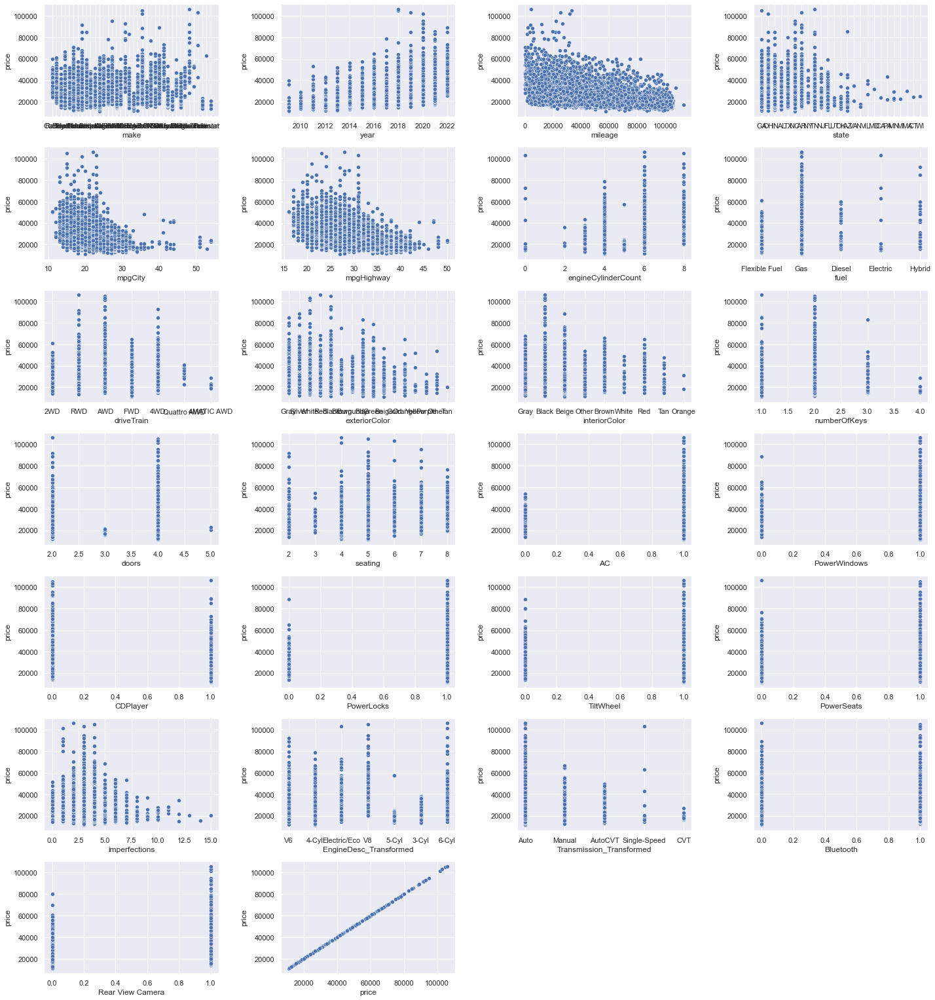

In [59]:
i = 1
plt.figure(figsize=(20,30))

#We're just looking for patterns here, so I won't bother formatting these particular graphs.
for col in carvana_df.columns.tolist():
    plt.subplot(10,4,i)
    sns.scatterplot(x=col, y='price', data=carvana_df)
    i = i + 1
    plt.tight_layout()

Nothing that is strikingly obvious. We already know we have some negatively correlated attributes such as mileage and imperfections.

As a baseline inference, I will label encode the object columns of our data. I will also check for skewness here.

In [60]:
obj_cols = carvana_df.select_dtypes(include='object').columns.tolist()

In [61]:
#num_cols = carvana_df.select_dtypes(exclude='object').columns.tolist()
num_cols = ['year', 'mileage', 'mpgCity', 'mpgHighway', 'engineCylinderCount', 'numberOfKeys', 'doors', 'seating', 'imperfections', 'price']
print(num_cols)

['year', 'mileage', 'mpgCity', 'mpgHighway', 'engineCylinderCount', 'numberOfKeys', 'doors', 'seating', 'imperfections', 'price']


In [62]:
carvana_df.dtypes

make                         object
year                        float64
mileage                     float64
state                        object
mpgCity                     float64
mpgHighway                  float64
engineCylinderCount         float64
fuel                         object
driveTrain                   object
exteriorColor                object
interiorColor                object
numberOfKeys                float64
doors                       float64
seating                     float64
AC                            int64
PowerWindows                  int64
CDPlayer                      int64
PowerLocks                    int64
TiltWheel                     int64
PowerSeats                    int64
imperfections               float64
EngineDesc_Transformed       object
Transmission_Transformed     object
Bluetooth                     int64
Rear View Camera              int64
price                       float64
dtype: object

In [63]:
skew_list = []
for col in num_cols:
    if np.abs(carvana_df[col].skew()) > 1.0:
        skew_list.append((col, carvana_df[col].skew()))
skew_df = pd.DataFrame(skew_list).sort_values(by=1, ascending=False)
skew_df

,0,1
4,price,2.079690
3,imperfections,1.579251
0,engineCylinderCount,1.258120
2,seating,1.162124
1,doors,-4.306745


### Mutual Information Regressor
We can use this technique to explore another avenue of individual feature importance to the target attribute price. We'll also use this as another point of investigation when deciding what to do with certain features, such as <i>numberOfKeys</i>.

In [64]:
X = carvana_df.copy()
y = X['price'].copy()

In [65]:
X.pop('price')

for colname in X.select_dtypes("object"):
    X[colname], _ = X[colname].factorize()

discrete_features = X.dtypes == int

In [66]:
mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
mi_scores = mi_scores.sort_values(ascending=False)

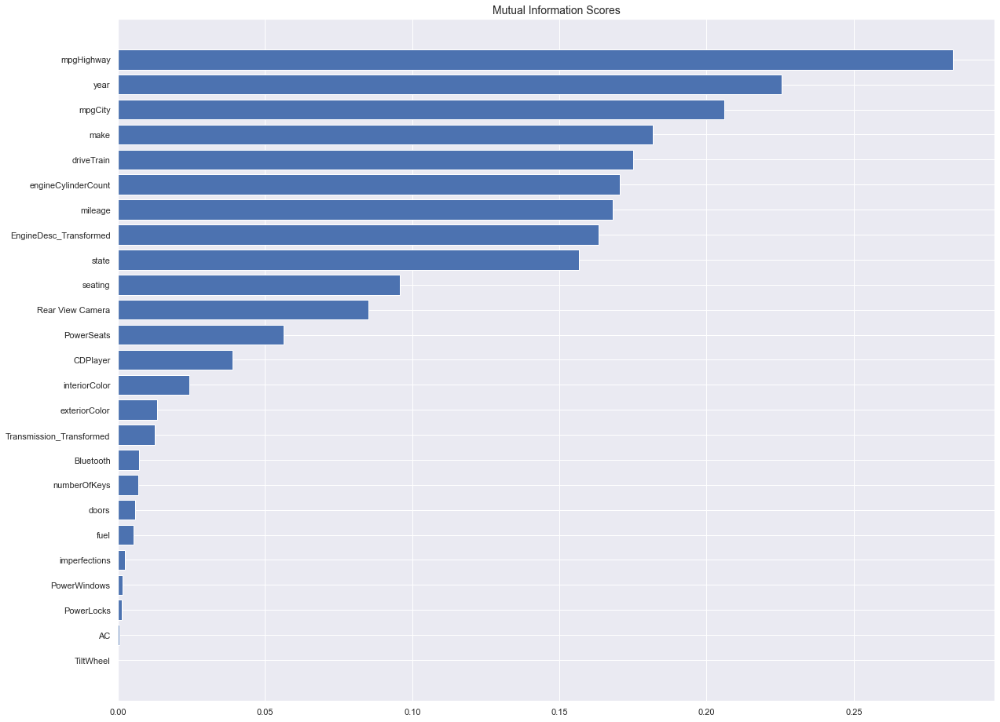

In [67]:
plt.figure(figsize=(20, 16))

mi_scores = mi_scores.sort_values(ascending=True)
width = np.arange(len(mi_scores))
ticks = list(mi_scores.index)
plt.barh(width, mi_scores)
plt.yticks(width, ticks)
plt.title("Mutual Information Scores", fontsize=14)
plt.show()

It turns out the engine description seems to influence price more than I originally anticipated. The basic car feature attributes appear to not contribute much to the price, including a Bluetooth feature.

Let's now transform the object cols into numeric categorical columns with Label Encoder.

In [68]:
for col in obj_cols:
    lbl_encoder = LabelEncoder()
    temp = lbl_encoder.fit_transform(carvana_df[[col]]).ravel()
    carvana_df[col] = temp

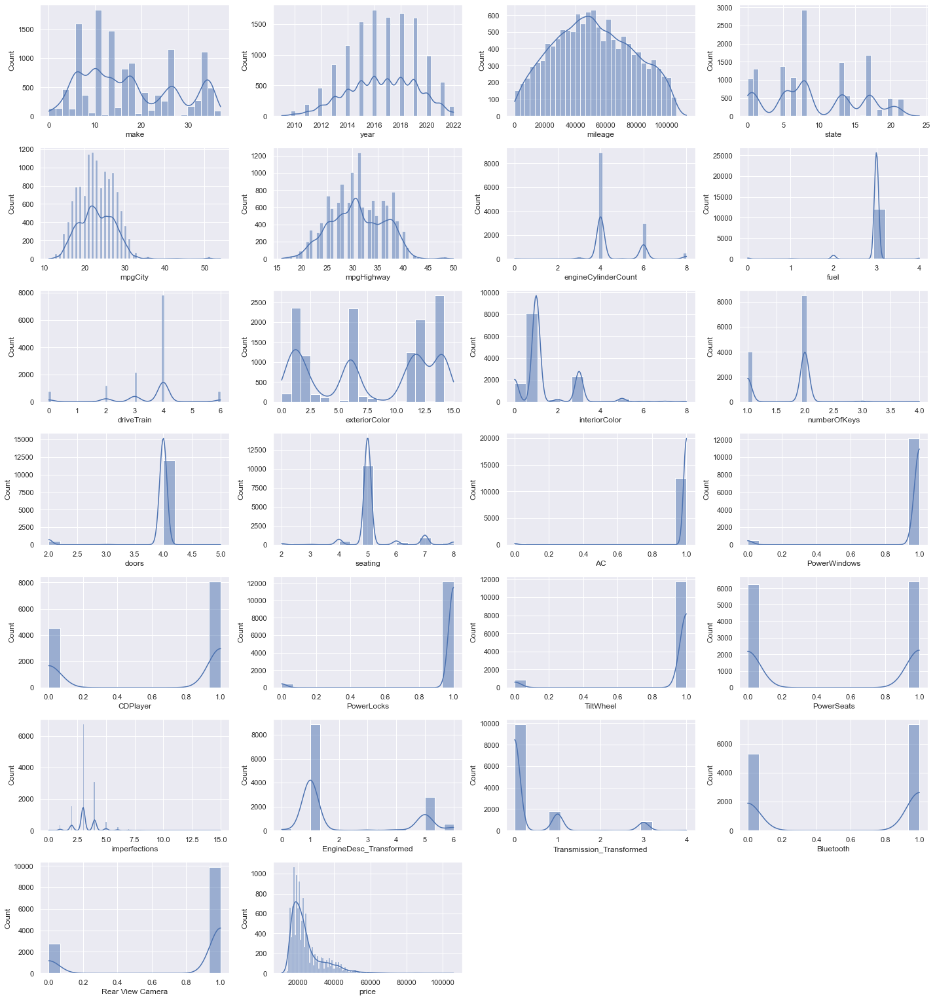

In [69]:
i = 1
plt.figure(figsize=(20,30))

for col in carvana_df.columns.tolist():
    plt.subplot(10,4,i)
    sns.histplot(x=col, data=carvana_df, kde=True)
    i = i + 1
    plt.tight_layout()

year


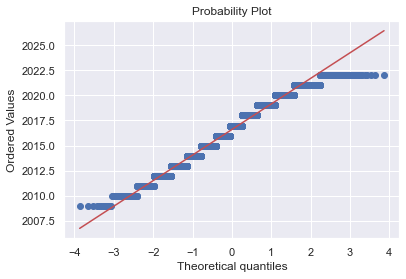

mileage


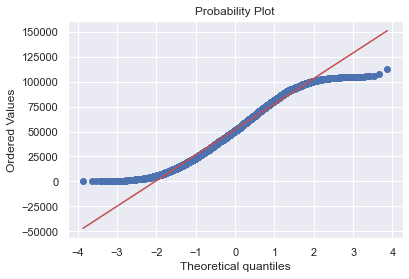

mpgCity


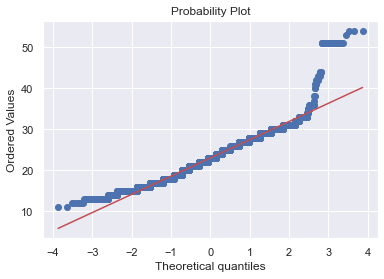

mpgHighway


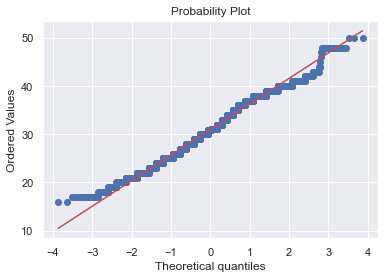

engineCylinderCount


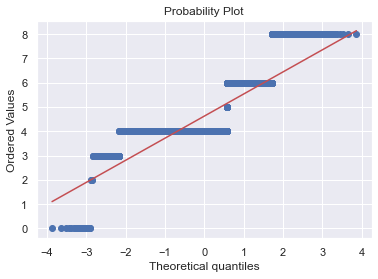

numberOfKeys


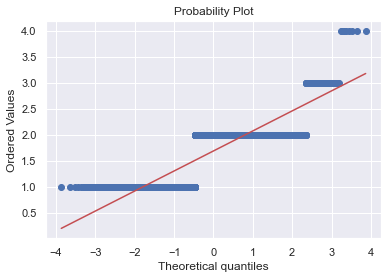

doors


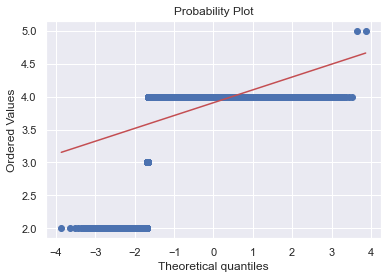

seating


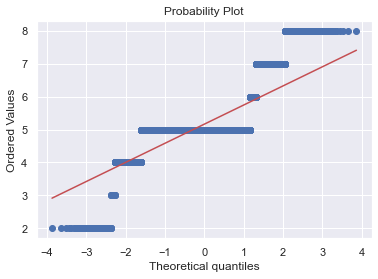

imperfections


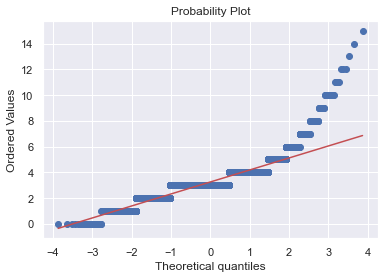

price


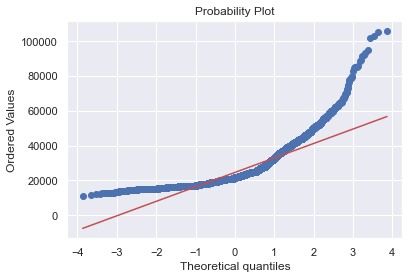

In [70]:
for col in num_cols: 
    stats.probplot(carvana_df[col], dist="norm", plot=pylab)
    print(col)
    pylab.show()

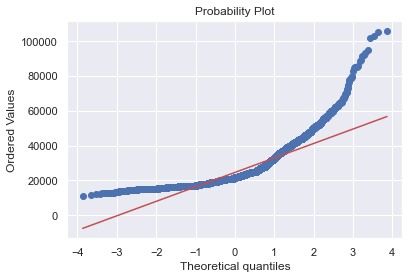

In [71]:
stats.probplot(carvana_df['price'], dist="norm", plot=pylab)

pylab.show()

<i>Target variable is positively skewed, as well as imperfections. Engine Cylinder Count and Seating appear negligible.

Since mpgHighway is more normally distributed to its partner mpgCity, mpgCity may be the column of the 2 we drop.</i>

We know we have some skewed columns such as the dependent variable price, and we know from looking at the unique values of that column that <b>Carvana assigns very definite price values to the cars they sell</b>. To explain, there are only 178 differnet values of price within the entire dataset of 12,000+ cars.

### Log Transformations of Select Attributes

In [72]:
#We will log transform imperfections and the target attribute, price

for col in ['imperfections', 'price']:
    carvana_df[col] = carvana_df[col].apply(np.log1p)

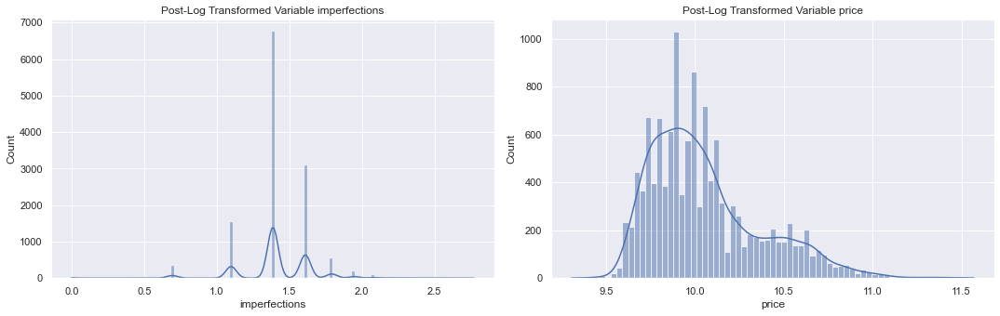

In [73]:
i = 1
plt.figure(figsize=(30,45))

for col in ['imperfections', 'price']:
    plt.subplot(10,4,i)
    sns.histplot(x=col, data=carvana_df, kde=True)
    i = i + 1
    plt.title(f"Post-Log Transformed Variable {col}")
    plt.tight_layout()


imperfections


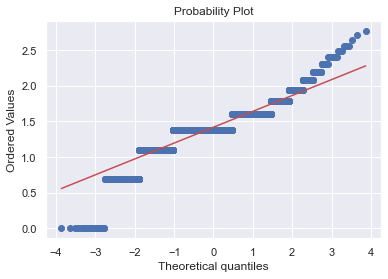

price


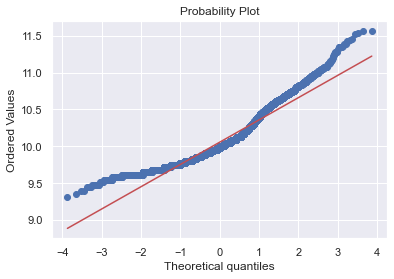

In [74]:
for col in ['imperfections', 'price']: 
    stats.probplot(carvana_df[col], dist="norm", plot=pylab)
    print(col)
    pylab.show()

Not perfect, but they are now much more normally distributed.

## Outlier Detection (w/ PyCaret)
Next, I would like to investigate if our data has a surplus amount of outliers. I first want to detect exisitng outliers before electing to remove them.

I first would like to try using Pycaret to detect anomalies across the entire dataset.

In [77]:
s = setup(carvana_df, normalize=True)

,Description,Value
0,session_id,2353
1,Original Data,"(12641, 26)"
2,Missing Values,False
3,Numeric Features,18
4,Categorical Features,8
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(12641, 34)"
9,CPU Jobs,-1


In [87]:
iforest = create_model('iforest', fraction=0.05)

In [88]:
iforest_results = assign_model(iforest)

In [89]:
iforest_results['Anomaly'].value_counts()

0    12009
1      632
Name: Anomaly, dtype: int64

In [90]:
iforest_results[iforest_results['Anomaly']==1]

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,fuel,driveTrain,exteriorColor,...,TiltWheel,PowerSeats,imperfections,EngineDesc_Transformed,Transmission_Transformed,Bluetooth,Rear View Camera,price,Anomaly,Anomaly_Score
17,17,2019.0,49910.0,1,18.00000,23.000000,6.0,3,2,1,...,1,0,1.386294,5,0,1,1,10.462846,1,0.078318
32,17,2021.0,3190.0,14,16.00000,23.000000,6.0,3,2,2,...,1,0,1.386294,5,3,0,1,10.682606,1,0.072083
52,6,2015.0,3519.0,17,17.00000,29.000000,8.0,3,6,1,...,1,1,1.386294,6,3,0,1,10.831529,1,0.048804
71,30,2019.0,20820.0,17,15.00000,22.000000,8.0,3,0,14,...,1,1,1.609438,6,0,0,0,10.507558,1,0.007180
103,12,2017.0,32548.0,1,17.00000,24.000000,6.0,3,6,14,...,1,1,1.609438,5,0,0,0,10.545105,1,0.025049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12564,37,2018.0,12082.0,17,23.03179,30.983699,0.0,1,6,14,...,0,0,1.609438,4,4,0,0,9.932609,1,0.103474
12572,8,2014.0,9919.0,21,15.00000,23.000000,8.0,3,6,8,...,1,0,1.386294,6,3,0,0,10.518430,1,0.048887
12601,17,2018.0,11760.0,13,16.00000,20.000000,6.0,3,2,1,...,0,0,1.386294,5,0,1,0,10.682606,1,0.027934
12647,17,2018.0,51395.0,17,23.00000,25.000000,4.0,3,2,1,...,1,0,1.098612,1,0,0,1,10.403990,1,0.065198


In [91]:
plot_model(iforest, plot = 'tsne')

In [92]:
plot_model(iforest, plot = 'umap')

Using PyCaret, it seems that none of the outliers detected lay in some concentrated plane or area. Since there aren't many, I don't want to discredit the importance of the datapoints PyCaret labelled as outliers.

In [94]:
outliers_df = iforest_results[iforest_results['Anomaly']==1]

In [102]:
outliers_df.head(50)

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,fuel,driveTrain,exteriorColor,...,TiltWheel,PowerSeats,imperfections,EngineDesc_Transformed,Transmission_Transformed,Bluetooth,Rear View Camera,price,Anomaly,Anomaly_Score
17,17,2019.0,49910.0,1,18.00000,23.000000,6.0,3,2,1,...,1,0,1.386294,5,0,1,1,10.462846,1,0.078318
32,17,2021.0,3190.0,14,16.00000,23.000000,6.0,3,2,2,...,1,0,1.386294,5,3,0,1,10.682606,1,0.072083
52,6,2015.0,3519.0,17,17.00000,29.000000,8.0,3,6,1,...,1,1,1.386294,6,3,0,1,10.831529,1,0.048804
71,30,2019.0,20820.0,17,15.00000,22.000000,8.0,3,0,14,...,1,1,1.609438,6,0,0,0,10.507558,1,0.007180
103,12,2017.0,32548.0,1,17.00000,24.000000,6.0,3,6,14,...,1,1,1.609438,5,0,0,0,10.545105,1,0.025049
119,6,2017.0,65928.0,17,29.00000,38.000000,4.0,3,4,1,...,1,0,1.791759,1,3,0,1,9.615205,1,0.043348
128,27,2019.0,67680.0,1,20.00000,27.000000,6.0,3,0,6,...,1,1,1.791759,5,1,0,0,10.165506,1,0.002516
129,17,2016.0,59841.0,13,16.00000,20.000000,6.0,3,2,14,...,1,0,1.609438,5,0,0,0,10.422013,1,0.078053
163,27,2018.0,43556.0,20,31.00000,39.000000,4.0,3,4,6,...,1,0,1.386294,1,1,0,0,9.679781,1,0.032577
181,27,2019.0,22397.0,13,14.00000,19.000000,8.0,3,0,6,...,0,1,1.386294,6,0,0,1,10.571086,1,0.025433


There doesn't appear to be any consistent patterns in the anomalies that PyCaret detected. Therefore, I'll elect to not remove any records from what PyCaret detected.

### Z-Score Outlier Detection
For extra assurance, we can also apply the z-score outlier detection method.

In [109]:
num_cols

['year',
 'mileage',
 'mpgCity',
 'mpgHighway',
 'engineCylinderCount',
 'numberOfKeys',
 'doors',
 'seating',
 'imperfections',
 'price']

In [116]:
zscore_df = pd.DataFrame()

In [117]:
for col in carvana_df.columns.tolist():
    z_score = zscore(carvana_df[col])
    #print(z_score)
    zscore_df[str(col)+"_zscore"] = z_score

In [118]:
zscore_df

,make_zscore,year_zscore,mileage_zscore,state_zscore,mpgCity_zscore,mpgHighway_zscore,engineCylinderCount_zscore,fuel_zscore,driveTrain_zscore,exteriorColor_zscore,interiorColor_zscore,numberOfKeys_zscore,doors_zscore,seating_zscore,AC_zscore,PowerWindows_zscore,CDPlayer_zscore,PowerLocks_zscore,TiltWheel_zscore,PowerSeats_zscore,imperfections_zscore,EngineDesc_Transformed_zscore,Transmission_Transformed_zscore,Bluetooth_zscore,Rear View Camera_zscore,price_zscore
0,1.273101,0.155543,-0.171948,-0.528001,-1.333326,-1.122018,1.220071,-2.892184,-2.864174,-0.340809,1.383083,0.636935,0.221374,1.074952,0.111418,0.203358,-1.333507,0.19323,0.272368,0.985159,-0.134022,1.545519,-0.440845,-1.178048,0.527409,1.011637
1,-1.228325,-0.623002,-0.359328,1.237008,-0.449330,0.377472,-0.550541,0.159322,2.019842,0.838918,1.383083,0.636935,0.221374,-0.207705,0.111418,0.203358,-1.333507,0.19323,0.272368,0.985159,1.532012,-0.608614,-0.440845,0.848862,0.527409,-0.094348
2,-1.328382,-0.233730,-0.127065,-0.207090,-0.891328,-0.747146,-0.550541,0.159322,-0.422166,1.232160,-0.324962,0.636935,0.221374,-0.207705,0.111418,0.203358,0.749902,0.19323,0.272368,0.985159,0.782863,-0.608614,-0.440845,0.848862,0.527409,-0.483042
3,1.673329,-2.180092,1.676410,-1.490734,-0.449330,-0.747146,-0.550541,0.159322,0.391837,1.232160,1.383083,0.636935,0.221374,-0.207705,0.111418,0.203358,0.749902,0.19323,0.272368,0.985159,-0.134022,-0.608614,-0.440845,-1.178048,0.527409,-1.192774
4,-0.327811,0.155543,0.505162,1.878830,0.213667,0.190036,-0.550541,0.159322,0.391837,0.642297,-0.324962,-1.428080,0.221374,-0.207705,0.111418,0.203358,0.749902,0.19323,0.272368,-1.015065,0.782863,-0.608614,-0.440845,0.848862,-1.896063,-1.075678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12636,0.072417,1.323360,-0.236624,0.755642,0.876665,0.377472,-0.550541,0.159322,0.391837,-1.323914,-0.324962,-1.428080,0.221374,-0.207705,0.111418,0.203358,0.749902,0.19323,0.272368,-1.015065,3.198046,-0.608614,-0.440845,-1.178048,0.527409,-0.465598
12637,1.673329,0.934088,0.479377,0.755642,-2.217323,-2.621509,2.990684,0.159322,-1.236169,1.232160,-0.324962,0.636935,0.221374,3.640266,0.111418,0.203358,0.749902,0.19323,0.272368,0.985159,-5.830230,2.084053,-0.440845,0.848862,0.527409,1.854296
12638,-0.728039,0.934088,0.064954,-0.528001,0.876665,0.752345,-0.550541,0.159322,0.391837,0.838918,-0.324962,-1.428080,0.221374,-0.207705,0.111418,0.203358,0.749902,0.19323,0.272368,-1.015065,5.297001,-0.608614,3.203841,-1.178048,0.527409,-1.333616
12639,1.673329,2.101905,-1.901430,-1.330278,0.876665,1.314654,-0.550541,0.159322,0.391837,1.232160,-0.324962,0.636935,0.221374,-0.207705,0.111418,0.203358,-1.333507,0.19323,0.272368,0.985159,-0.134022,-0.608614,-0.440845,-1.178048,0.527409,1.845900


In [143]:
outlier_set = set()

for col in zscore_df.columns.tolist():
    temp_set = set(zscore_df[zscore_df[col]>=3.0].index.tolist())
    outlier_set.update(temp_set)
    
outlier_set = sorted(list(outlier_set))

In [145]:
len(outlier_set)

1690

It appears we have 1690 records where at least one row has a z-score of at least 3.0. Let's look at the records where these indices are.

In [147]:
carvana_df.iloc[outlier_set, :]

,make,year,mileage,state,mpgCity,mpgHighway,engineCylinderCount,fuel,driveTrain,exteriorColor,interiorColor,numberOfKeys,doors,seating,AC,PowerWindows,CDPlayer,PowerLocks,TiltWheel,PowerSeats,imperfections,EngineDesc_Transformed,Transmission_Transformed,Bluetooth,Rear View Camera,price
8,27,2018.0,51340.0,1,13.00000,18.000000,8.0,3,2,3,1,2.0,4.0,8.0,1,1,0,1,1,1,2.079442,6,0,0,1,10.635639
13,32,2017.0,32600.0,17,25.00000,34.000000,4.0,3,3,11,1,2.0,4.0,5.0,1,1,1,1,1,1,1.386294,1,3,0,1,10.025307
14,27,2019.0,12837.0,13,15.00000,21.000000,8.0,3,2,1,5,1.0,4.0,6.0,1,1,1,1,1,0,1.609438,6,0,1,1,10.596410
20,15,2018.0,17731.0,17,19.00000,26.000000,6.0,3,3,6,1,1.0,4.0,7.0,1,1,1,1,1,1,1.386294,5,3,0,1,10.507558
21,35,2013.0,51219.0,13,23.00000,33.000000,5.0,3,4,12,1,1.0,2.0,5.0,1,1,1,1,1,0,1.098612,2,3,0,0,9.654449
24,18,2021.0,5962.0,0,25.00000,31.000000,4.0,3,4,12,1,1.0,4.0,5.0,1,1,1,1,1,0,1.098612,1,3,0,0,10.085434
25,18,2015.0,51239.0,8,24.00000,30.000000,4.0,3,4,14,0,2.0,4.0,5.0,1,1,0,1,1,0,0.693147,1,3,0,0,9.654449
29,13,2018.0,50450.0,20,18.00000,26.000000,6.0,3,3,14,1,2.0,4.0,8.0,1,1,1,1,1,1,0.693147,5,0,0,1,10.403990
32,17,2021.0,3190.0,14,16.00000,23.000000,6.0,3,2,2,1,2.0,4.0,5.0,1,0,0,0,1,0,1.386294,5,3,0,1,10.682606
33,17,2015.0,30900.0,0,22.00000,31.000000,4.0,3,0,12,5,2.0,4.0,5.0,1,1,1,1,1,0,1.609438,1,0,0,0,9.951849


Looking at it this way, it is difficult to find any distinct patterns in what would indicate an outlier unless we delete
these rows. For now, I will leave this section as only detecting outliers and won't remove any for the time being. If we wish to experiment with removing records, we can come back here and do so.

In [153]:
iforest_anomaly_set = set(iforest_results[iforest_results['Anomaly']==1].index.tolist())

In [154]:
iforest_anomaly_set.update(iforest_anomaly_set, outlier_set)

In [156]:
iforest_anomaly_set = sorted(list(iforest_anomaly_set))

In [158]:
len(iforest_anomaly_set)

2202

It seems there were a lot of differences between the outliers detected by both of these methods as well.

I'll now export this processed dataframe as we move into modeling.

In [159]:
carvana_df.to_csv("carvana_postprocessed.csv")